# Spiral-shaped distribution

```
Copyright (C) 2021

Code by Leopoldo Sarra and Florian Marquardt
Max Planck Institute for the Science of Light, Erlangen, Germany
http://www.mpl.mpg.de

This work is licensed under the Creative Commons Attribution 4.0 International License. To view a copy of this license, visit http://creativecommons.org/licenses/by/4.0/ or send a letter to Creative Commons, PO Box 1866, Mountain View, CA 94042, USA.

If you find this code useful in your work, please cite our article
"Renormalized Mutual Information for Artificial Scientific Discovery", Leopoldo Sarra, Andrea Aiello, Florian Marquardt, arXiv:2005.01912

available on

https://arxiv.org/abs/2005.01912
```


In this notebook we show how one can extract an optimal feature by maximizing renormalized mutual information. This is the code used to generate the example with the spiral-shaped distribution in the paper. 

We consider as input samples $x = (x1,x2)$ the transformation of Gaussian distributed $x'=(x_1',x_2')$ to
$$\begin{cases}
                x_1 &= x_1' \cos(\alpha r') - x'_2 \sin(\alpha r') \\
                x_2 &= x_1'  \sin(\alpha r') + x'_2 \cos(\alpha r') \\
\end{cases}$$

with $r=\sqrt{x_1'^2 + x_2'^2}$ and $\alpha$ a parameter that controls the twist of the transformation.

The goal is to find a one dimensional feature $y=f(x_1,x_2)$ that preserves the largest information on the input $x$ variables.

In [1]:
# Load libraries
import numpy as np
import matplotlib.pyplot as plt
import scipy as sc
from scipy import interpolate

import rmi.neuralnets as nn
import rmi.estimation as inf
import rmi.features as f

from rmi.examples.spiral import SpiralDistribution
from rmi.pca import pca

from tqdm import tqdm, trange

%load_ext line_profiler
%load_ext autoreload
%autoreload 2

In [2]:
# Define the input distribution
sp = SpiralDistribution(sx=0.8,
                        sy=1,
                        r=-0.7,
                        alpha=0.5)

## Feature Extraction

We train a neural network to find a feature function that optimizes Renormalized Mutual Information with the input.

In other words, the unsupervised network is optimizing the cost function 
$$
C = - \tilde{I}(x,f(x)) + \lambda_\text{gauss} KL(f,g) = - \left( H(f) - \frac{1}{2} \langle \log ||\nabla f(x)||^2  \rangle_x \right) + \lambda_\text{gauss} KL(f||g) 
$$
where $g$ is a normal Gaussian distribution and the last term is only a regularization that fixes the output distribution to a Gaussian. This is only used to make the convergence of the network more stable - we can arbitrary choose any deformation of feature by reparametrization invariance.

In [3]:
n_in = 2
n_out = 1

# Number of neurons in each layer of the network
n_neurons = 30

# Strength of the constraint on the output distribution
# of the feature (exploiting reparametrization invariance)
coeff_gauss = 5.0

# Options to estimate the entropy H(y)
# Number of bins
H_nbins = 180

# Size of the kernel placed on each point
# to make the histogram differentiable
# (in units of the histogram-cell-width)
H_kernel_size = 1

N_train = 30000
batchsize = 100
eta = 0.005

In [4]:
# Define the layout of the neural network
# The cost function is implicit when choosing the model RMIOptimizer
rmi_optimizer = nn.RMIOptimizer(H_nbins,
                                H_kernel_size,
                                coeff_gauss,
                                layers=[
    nn.K.layers.Dense(n_neurons, activation="tanh",
                  input_shape=(n_in,)),
    nn.K.layers.Dense(n_neurons, activation="tanh"),
    nn.K.layers.Dense(n_out)
])

# Compile the network === choose the optimizer to use during the training
rmi_optimizer.compile(optimizer=nn.tf.optimizers.Adam(eta))

# Print the table with the structure of the network
rmi_optimizer.summary()

# Define an objects that handles the training and 
# automatically saves the model and the training history
rmi_net = nn.Net(rmi_optimizer,
                 path="models/spiral",
                 mode="a")

Model: "rmi_optimizer"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 30)                90        
_________________________________________________________________
dense_1 (Dense)              (None, 30)                930       
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 31        
Total params: 1,051
Trainable params: 1,051
Non-trainable params: 0
_________________________________________________________________
Loaded neural network weights from models/spiral


In [5]:
# Perform the training of the neural network
rmi_net.fit_generator(lambda: sp.sample(batchsize), N_train)

Model already trained, skipping training.


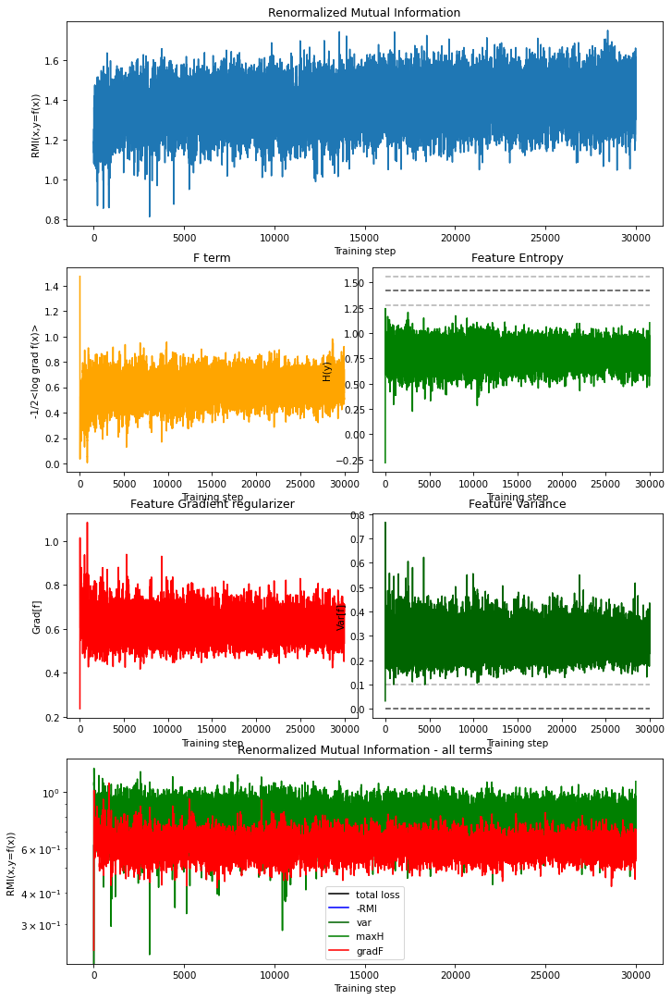

In [6]:
# Plot the training history (and other useful quantities)
rmi_net.plot_rmi_cost()

## Plot the feature 
Here we plot the extracted feature on top of the input distribution.
Intuitively, if the feature follows the "main direction" on which the input distribution
lies, it provides the most useful one-dimensional "curvilinear" coordinate

In [7]:
# Range of the plot
xmin = -4
xmax = 4
# Number of points in the grid
N = 100

x_linspace = np.linspace(xmin, xmax, N)
x1_grid, x2_grid = np.meshgrid(x_linspace, x_linspace, indexing='ij')
x_points = np.array([x1_grid.flatten(), x2_grid.flatten()])

# Get the theoretical distribution of x
# (instead of sampling and making a 2d histogram
# we simply transform the Gaussian distribution)
P_x = sp.P_x(x_points.T).reshape([N, N])

# Get the extracted feature (on an equally-spaced grid)
# (for plotting it)
feat = rmi_optimizer(x_points.T).numpy().reshape([N,N])

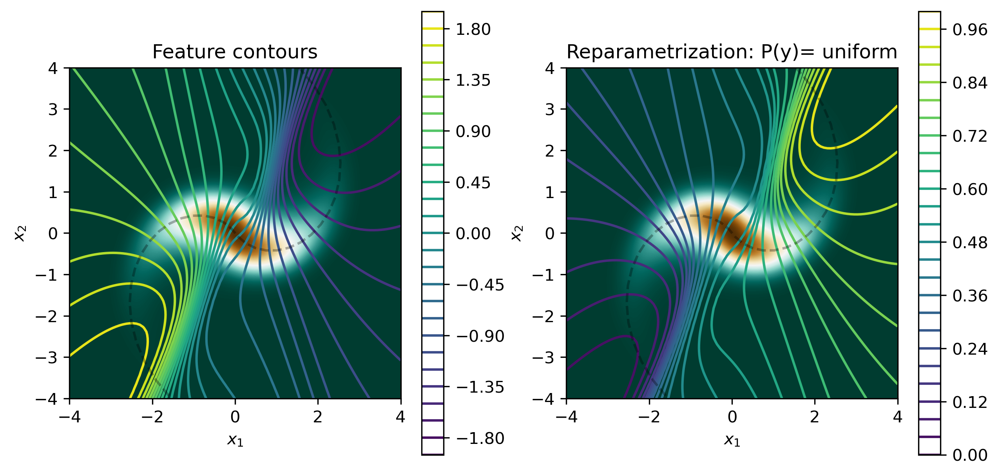

In [11]:
# ------------------------------------------------------------
# Plot
# Plot the theoretical distribution and the extracted feature on the top


plt.figure(figsize=[10,5],dpi=300)
plt.subplot(1,2,1)
plt.title("Feature contours")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.xlim([-4,4])
plt.ylim([-4,4])
plt.gca().set_aspect('equal')
# Draw the input distribution on the background
plt.contourf(x1_grid,x2_grid, P_x, 1000, cmap=plt.cm.BrBG_r)

# Draw a line along the main direction of the spiral on the background
spiral_theta = sp.get_theta()[0]
spiral_line = np.array([np.cos(spiral_theta), np.sin(spiral_theta)])[None,:]*np.linspace(-6,6,50)[:,None]
spiral_axis = sp.spiralize_batch(spiral_line)
plt.plot(spiral_axis[:,0], spiral_axis[:,1], "--", alpha=0.3, c="black")

# Draw the contour lines of the extracted feature
plt.contour(x1_grid,x2_grid, feat,25)
plt.colorbar()


# ------------------------------------------------------------
# Exploit the reparametrization invariance:
# We plot the same feature but transforming the output distribution
# to uniform between 0 and 1.
def feature_scaleFixed(rmi_optimizer, x_points, rescale=1):
    """Fix the scale of the feature to output a uniform distribution
    
    We choose H(y=f(x)) to have a uniform distribution.
    The only remaining ambiguity is the sign of the gradient of the feature (increasing feature or decreasing feature). 
    For example, this can be fixed by flipping all decreasing feature (choose rescale = -1 if feature is decreasing, otherwise rescale = 1)

    Args:
        rmi_optimizer (function): should return the feature calculated on x_points
        x_points (array_like): [N_samples, 2] batch of points to rescale. It is important to provide a large batch in order to properly estimate the cumulative of the feature.
        rescale (int, optional): either 1 or -1, factor to which rescale the final uniform feature. Defaults to 1.
    
    Returns:
        array_like: the rescaled rmi_optimizer(x_points) so that the distribution is output
    """
    
    tf_x = nn.tf.convert_to_tensor(x_points, dtype=nn.K.backend.floatx())
    tf_f = nn.tf.transpose(rescale*rmi_optimizer(tf_x))
    f = tf_f.numpy()

    tf_y_minimum = nn.tf.reduce_min(tf_f)
    tf_y_maximum = nn.tf.reduce_max(tf_f)
    tf_ydlt = (tf_y_maximum-tf_y_minimum)/nn.tf.cast(rmi_optimizer.H_nbins-1, nn.K.backend.floatx())

    tf_y_min = tf_y_minimum - 3*tf_ydlt
    tf_y_max = tf_y_maximum + 3*tf_ydlt

    tf_y_linspace = nn.tf.reshape(nn.tf.linspace(tf_y_min, tf_y_max, rmi_optimizer.H_nbins),
                               [rmi_optimizer.H_nbins, 1])
    tf_P_y,  tf_ydelta = rmi_optimizer.tf_calcProbabilityDistribution(tf_f)

    Py = tf_P_y.numpy()
    ydelta = tf_ydelta.numpy()
    # It is very easy to obtain the function to transform the feature to have uniform distribution
    # Indeed, we know that the cumulative of the distribution gives the right result.
    # It is crucial to multiply by ydelta because ydelta is not fixed, but different each time (and different from 1)
    G = np.cumsum(Py)*ydelta
    y_linspace = tf_y_linspace.numpy().flatten()

    f_norm = sc.interpolate.CubicSpline(y_linspace, G)(f)
    return f_norm


# Normalize the extracted feature to have uniform distribution
a = - np.sign(feat[0, 0]-feat[-1, -1])
fnorm = feature_scaleFixed(rmi_optimizer, x_points.T, a).reshape([N, N])

# Plot again for comparison
# We only changed the "distance" between two different contour lines
plt.subplot(1,2,2)
plt.title("Reparametrization: P(y)= uniform")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.xlim([-4,4])
plt.ylim([-4,4])
plt.gca().set_aspect('equal')
plt.contourf(x1_grid,x2_grid, P_x, 1000, cmap=plt.cm.BrBG_r)
plt.plot(spiral_axis[:,0], spiral_axis[:,1], "--", alpha=0.3, c="black")
plt.contour(x1_grid,x2_grid, fnorm,25)
plt.colorbar()
plt.show()

## Calculate RMI of the extracted feature

In [14]:
# Sample a large batch for a more precise estimation
x_batch = sp.sample(100000)

# Calculate the feature and its gradient with respect to the input
feat, grad_feat = rmi_net.get_feature_and_grad(x_batch)

# Estimate Renormalized Mutual Information
inf.RenormalizedMutualInformation(feat, grad_feat)

1.7096172298951122

### Principal Component Analysis feature

We calculate the feature provided by Principal Component Analysis performed on the input samples $x$.
PCA can only provide a linear distribution, so it cannot "deform" to follow the shape of a non-Gaussian distribution.

In [9]:
# Perform PCA
mypca = pca(sp.sample(100000),1)

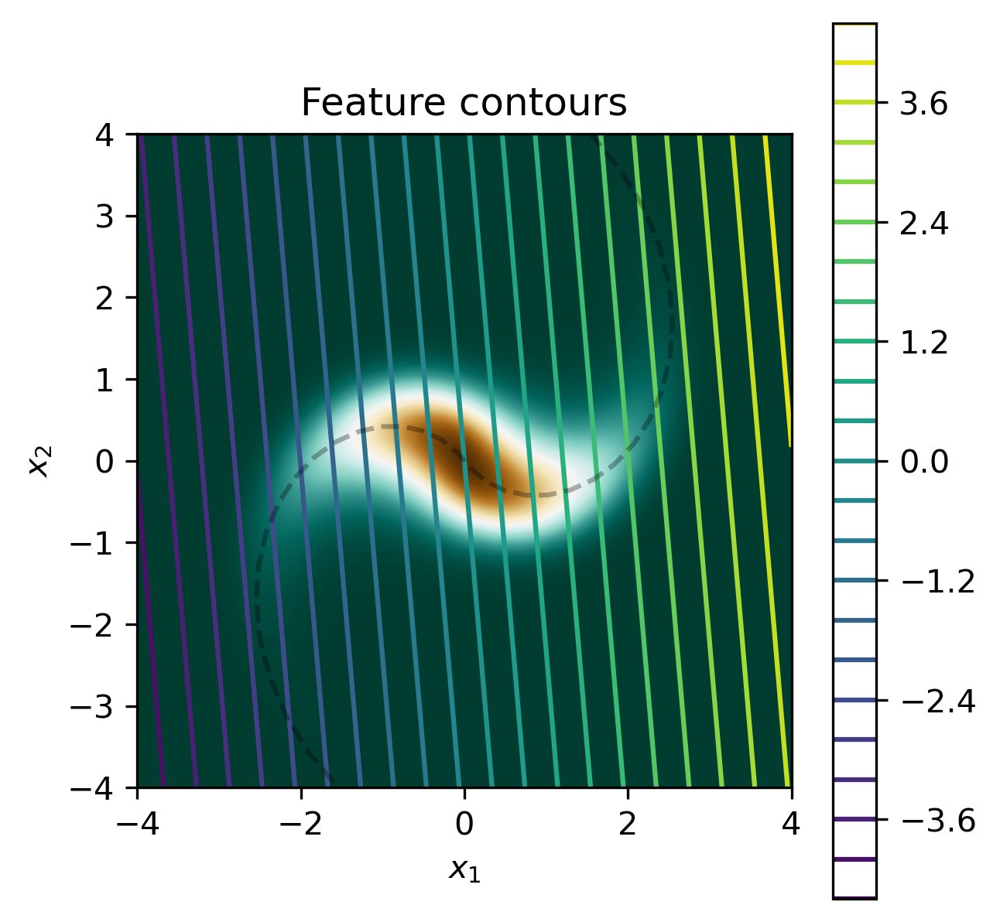

In [10]:
# Calculate the feature on an equally spaced grid
# (for plotting)
fpca = mypca.transform(x_points.T).reshape([100,100])

plt.figure(figsize=[10,5],dpi=300)
plt.subplot(1,2,1)
plt.title("Feature contours")
plt.xlabel(r"$x_1$")
plt.ylabel(r"$x_2$")
plt.xlim([-4,4])
plt.ylim([-4,4])
plt.gca().set_aspect('equal')
plt.contourf(x1_grid,x2_grid, P_x, 1000, cmap=plt.cm.BrBG_r)
plt.plot(spiral_axis[:,0], spiral_axis[:,1], "--", alpha=0.3, c="black")
plt.contour(x1_grid,x2_grid, fpca,25)
plt.colorbar()
plt.show()

## Comparison with Principal Component Analysis

In [11]:
N_estimate = 100000
inf_pca = inf.RenormalizedMutualInformation(*f.pca(sp.sample(N_estimate)))
inf_nn = inf.RenormalizedMutualInformation(*rmi_net.get_feature_and_grad(sp.sample(N_estimate)))

print("RMI of the NN feature: \t\t%2.2f" % inf_nn)
print("RMI of the PCA feature: \t%2.2f" % inf_pca)
print("Delta: \t\t\t\t%2.2f" % (inf_nn - inf_pca))

RMI of the NN feature: 		1.71
RMI of the PCA feature: 	1.52
Delta: 				0.19


---

#### Code to save the plots for the paper

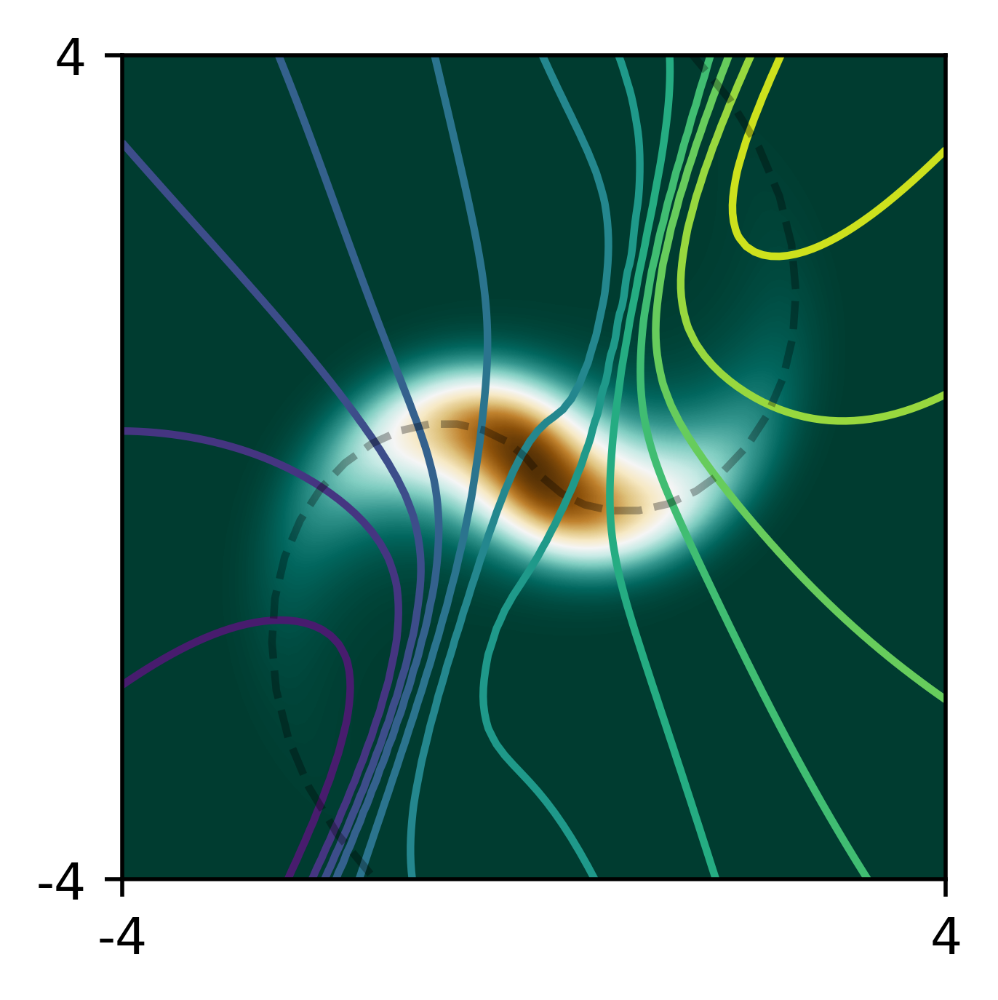

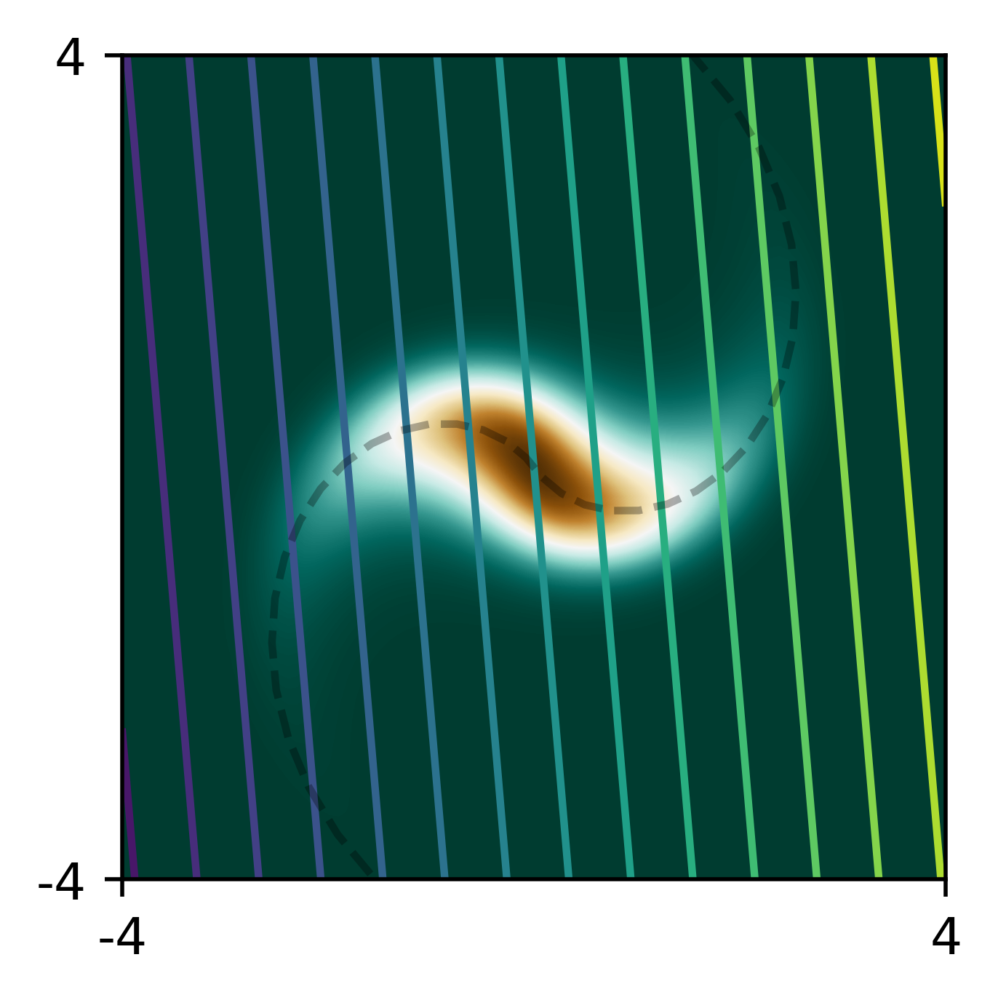

In [12]:
plt.figure(figsize=[3,3],dpi=500)
# plt.title("Feature contours")
# plt.xlabel(r"$x_1$")
# plt.ylabel(r"$x_2$")
plt.xticks([-4,4], ["-4","4"])
plt.yticks([-4,4], ["-4","4"])
plt.xlim([-4,4])
plt.ylim([-4,4])
plt.gca().set_aspect('equal')
plt.contourf(x1_grid,x2_grid, P_x, 1000, cmap=plt.cm.BrBG_r)
plt.plot(spiral_axis[:,0], spiral_axis[:,1], "--", alpha=0.3, c="black")
plt.contour(x1_grid,x2_grid, fnorm,15)
plt.savefig("figures/spiral" + "_nn.pdf")
plt.show()



plt.figure(figsize=[3,3],dpi=500)
# plt.title("Feature contours")
# plt.xlabel(r"$x_1$")
# plt.ylabel(r"$x_2$")
plt.xticks([-4,4], ["-4","4"])
plt.yticks([-4,4], ["-4","4"])
plt.xlim([-4,4])
plt.ylim([-4,4])
plt.gca().set_aspect('equal')
plt.contourf(x1_grid,x2_grid, P_x, 1000, cmap=plt.cm.BrBG_r)
plt.plot(spiral_axis[:,0], spiral_axis[:,1], "--", alpha=0.3, c="black")
plt.contour(x1_grid,x2_grid, fpca,15)
plt.savefig("figures/spiral" + "_pca.pdf")
plt.show()